# New CVID data

### Analysis based on GEX only

17.12.2020

12.09.2021: reanalysis without BCR activation and twins data

(Preprocessing happened in notebook M1)

Step-by-step workflow - **different to the scRNA-seq integration in doublet calling**:
- load preprocessed object
- do SCTransfor instead of normalising & log transforming
- save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- filter out cell cycle genes
- subset to HVGs
- (skipping scaling, not necessary because we've done SCTransform)
- pca (can also do preliminary neighbors/bbknn+umap here to peak at the data)
- **train a logreg model and add annotation (before it used to be earlier in the workflow)**
- neighbors/bbknn - deciding on which batch correction we will be using
- perform **step 2** of bertie doublet calling (requires running louvain clustering, see code)
- umap
- unbiased clustering
- save

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import anndata
# need to do 'pip3 install bbknn==1.3.8' to avoid incompatibility errors
import bbknn
# requires 'pip install scrublet'
#import scrublet as scr
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import matplotlib as mpl
import scipy
import matplotlib.pyplot as plt
import pickle

In [2]:
np.random.seed(0)

In [3]:
%%bash

pip freeze

aiohttp==3.6.2
alembic==1.3.0
anndata==0.7.5
annoy==1.16.2
async-generator==1.10
async-timeout==3.0.1
attrs==19.3.0
backcall==0.1.0
bbknn==1.3.6
bleach==3.1.0
blinker==1.4
certifi==2019.9.11
certipy==0.1.3
cffi==1.13.2
chardet==3.0.4
Click==7.0
conda==4.7.12
conda-package-handling==1.6.0
cryptography==2.8
cycler==0.10.0
Cython==0.29.14
decorator==4.4.1
defusedxml==0.6.0
entrypoints==0.3
fbpca==1.0
geosketch==1.0
get-version==2.1
h5py==2.10.0
idna==2.8
imageio==2.9.0
importlib-metadata==0.23
intervaltree==2.1.0
ipykernel==5.1.3
ipython==7.9.0
ipython-genutils==0.2.0
jedi==0.15.1
Jinja2==2.10.3
joblib==0.14.0
json5==0.8.5
jsonschema==3.1.1
jupyter-client==5.3.3
jupyter-core==4.5.0
jupyter-rsession-proxy==1.0b6
jupyter-server-proxy==1.2.0
jupyterhub==1.0.0
jupyterlab==1.2.1
jupyterlab-server==1.0.6
kiwisolver==1.1.0
legacy-api-wrap==1.2
leidenalg==0.7.0
llvmlite==0.30.0
loompy==3.0.6
louvain==0.6.1
Mako==1.1.0
MarkupSafe==1.1.1
matplotlib==3.3.4
mistune==0.8.4
more-itertools==7.2.0
multid

In [4]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

-----
anndata     0.7.5
scanpy      1.6.0
sinfo       0.3.1
-----
PIL                 8.1.0
anndata             0.7.5
annoy               NA
attr                19.3.0
backcall            0.1.0
bbknn               NA
cffi                1.13.2
constants           NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.1
get_version         2.1
h5py                2.10.0
highs_wrapper       NA
igraph              0.7.1
importlib_metadata  0.23
ipykernel           5.1.3
ipython_genutils    0.2.0
jedi                0.15.1
joblib              0.14.0
kiwisolver          1.1.0
legacy_api_wrap     1.2
leidenalg           0.7.0
llvmlite            0.30.0
louvain             0.6.1
matplotlib          3.3.4
more_itertools      NA
mpl_toolkits        NA
natsort             6.2.0
numba               0.46.0
numexpr             2.7.0
numpy               1.17.4
packaging           19.2
pandas              0.25.3
parso               0.5.1
pexpect        

In [5]:
save_path = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/'

## Reding the processed & analysed object

GEX-only based analysis, BBKNN batch correction

In [6]:
# reading
adata = sc.read(save_path+'adata_hvg_bbknn_by_sample_validation_cohort_20210210.h5ad')

In [7]:
adata

AnnData object with n_obs × n_vars = 107050 × 2791
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase', 'probabilities', 'celltype_predictions'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'ccgs', 'celltype_predictions_colors', 'donor_colors', 'hvg', 'n

In [8]:
markers = ['CD4','CD3G', 'FOXJ1', 'IL2R', 'TRDV2', 'CD8', # T cells
                             'CD19', 'MS4A1', # B cells
                              'CD27', 'CD38', 'JCHAIN', # Plasma B cells
                             'NCAM1', 'FCGR3A', # NK celss
                             'HBB', # Erythrocytes
                             'FCGR3B', # Neutrophils
                             'CD14', 'S100A12', # Monocytes
                             'FLT3', # Dendritic cells
                             'IRF4', 'CLEC9A', # cDC1
                             'CD1C', # cDC2
                             'TNFRSF21', # pDC and IRF4
                             'CD34', # Precursors
                             'PPBP', 'TUBB1', 'PF4', # Platelets
                             'MI67', # cycling
                            ]

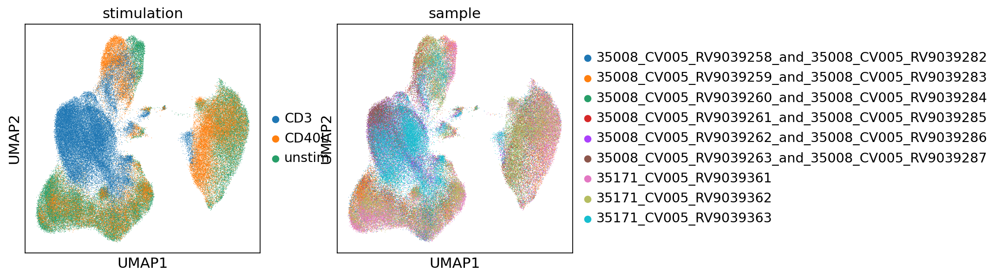

In [9]:
sc.pl.umap(adata, color=['stimulation','sample'])

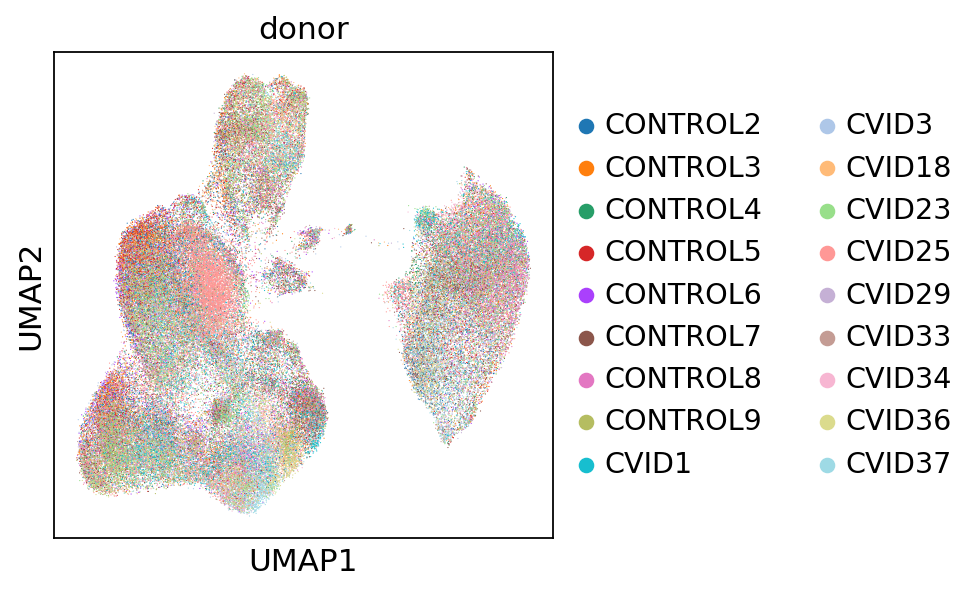

In [10]:
sc.pl.umap(adata, color=['donor'])

KeyError: 'CD8'

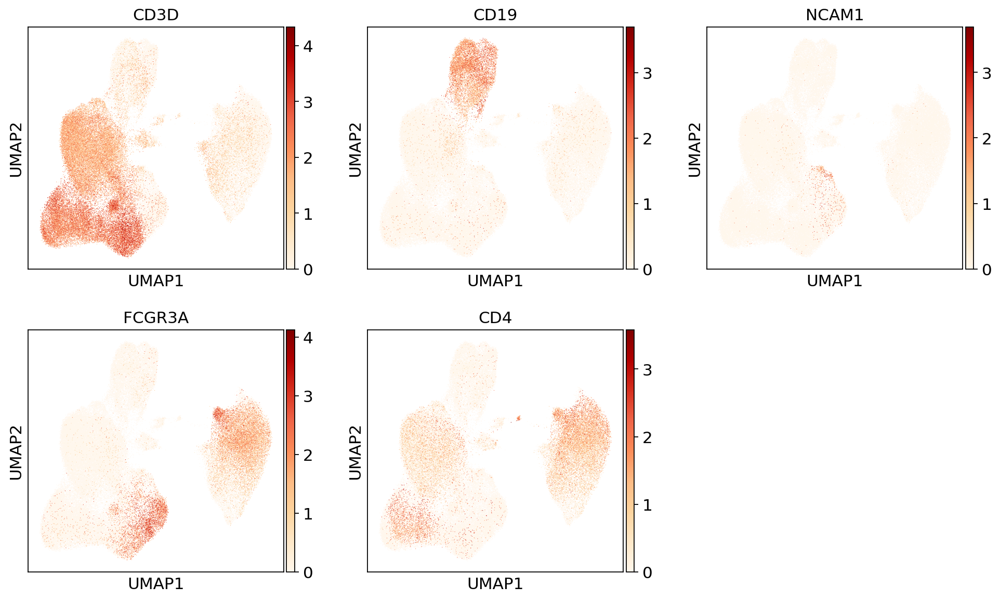

In [34]:
sc.pl.umap(adata, color=['CD3D', # T cells
                             'CD19', # B cells
                             # NK markers
                             'NCAM1', # CD56
                             'FCGR3A', # CD16
                         'CD4','CD8',
                            ], ncols=3, use_raw=True, cmap='OrRd')

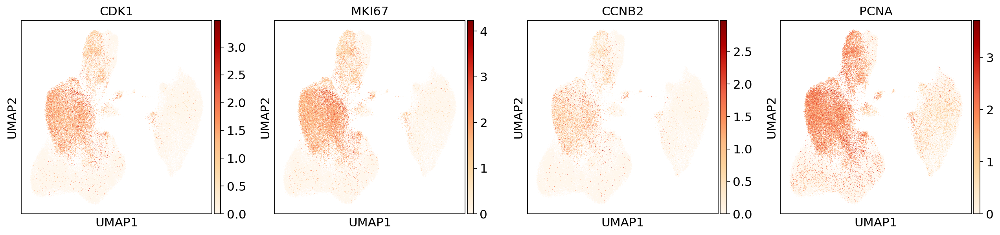

In [12]:
sc.pl.umap(adata, color=['CDK1','MKI67','CCNB2','PCNA'], cmap='OrRd')

In [13]:
adata

AnnData object with n_obs × n_vars = 107050 × 2791
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase', 'probabilities', 'celltype_predictions'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'ccgs', 'celltype_predictions_colors', 'donor_colors', 'hvg', 'n

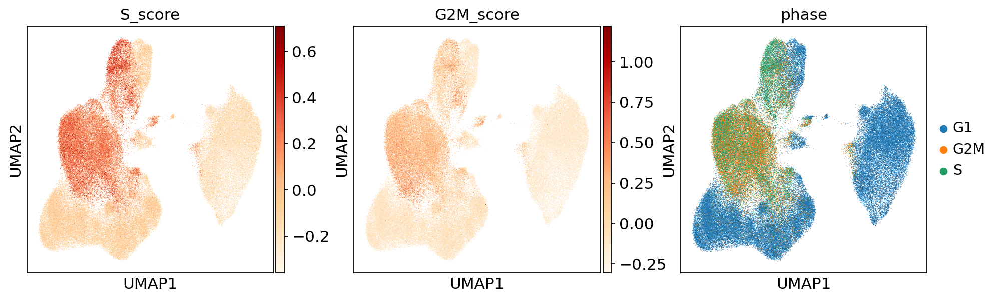

In [14]:
sc.pl.umap(adata, color=['S_score','G2M_score','phase'], cmap='OrRd')

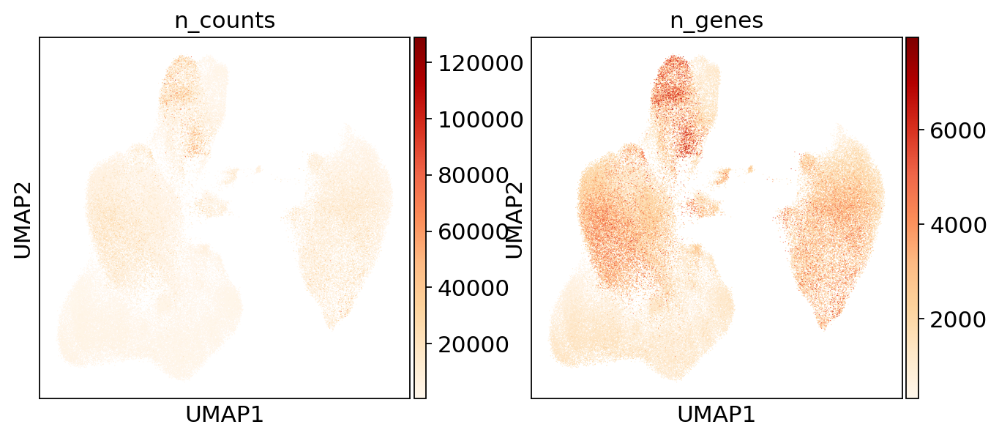

In [15]:
sc.pl.umap(adata, color=['n_counts',
                             'n_genes'], cmap='OrRd')

In [ ]:
sc.pl 

### Unbiased clustering

In [23]:
%%time
sc.tl.louvain(adata, resolution=2.5)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 29 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:49)
CPU times: user 47 s, sys: 2.76 s, total: 49.8 s
Wall time: 49.6 s


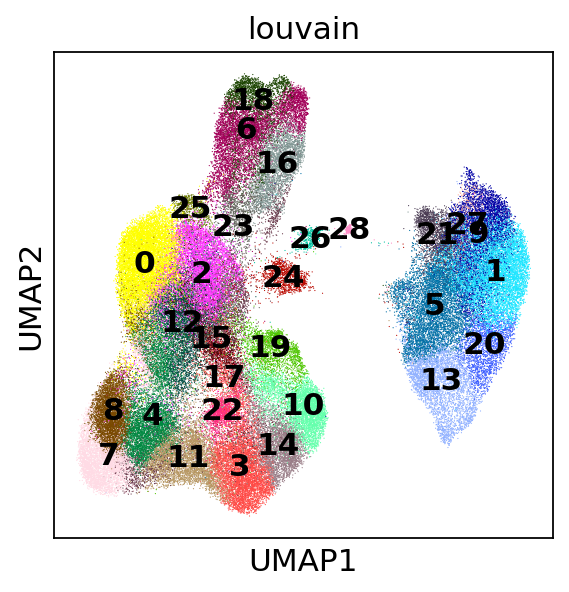

In [24]:
sc.pl.umap(adata, color=['louvain'], legend_loc='on data')

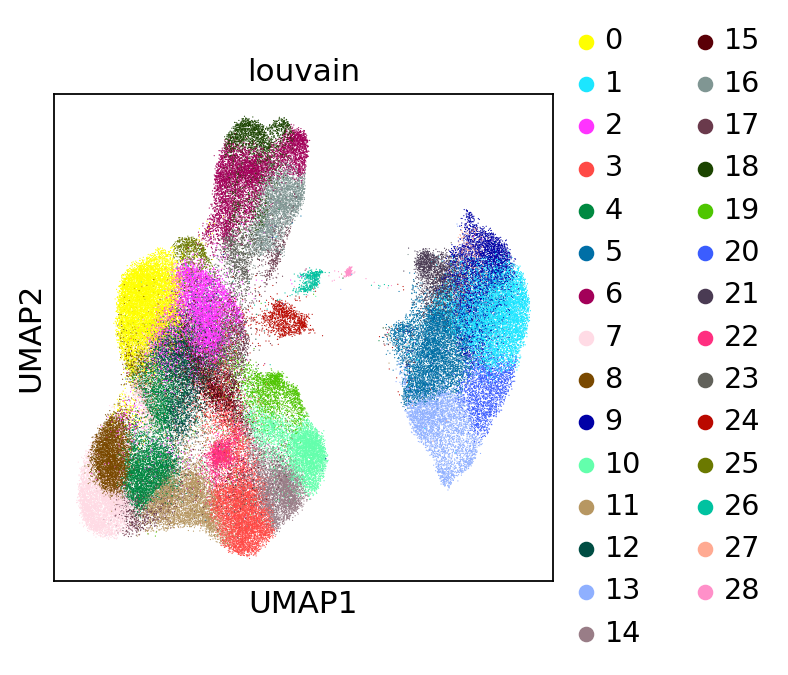

In [25]:
sc.pl.umap(adata, color=['louvain'], 
           #legend_loc='on data',
           
          )

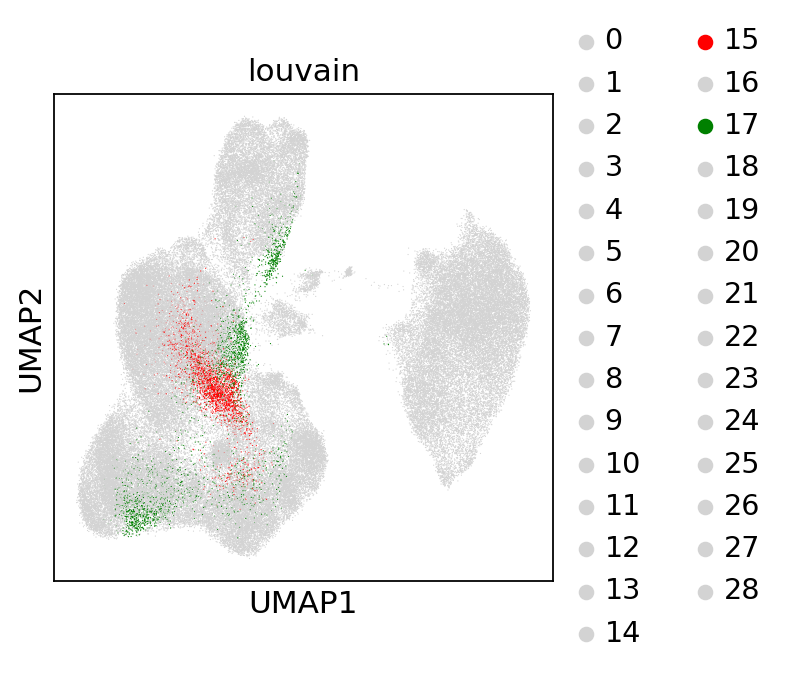

In [26]:
# seeing where 15 and 17 are
sc.pl.umap(adata, color=['louvain'], 
          palette=['lightgrey']*15 + ['red'] + ['lightgrey']*1 + ['green']*1 + ['lightgrey']*11
           
          )

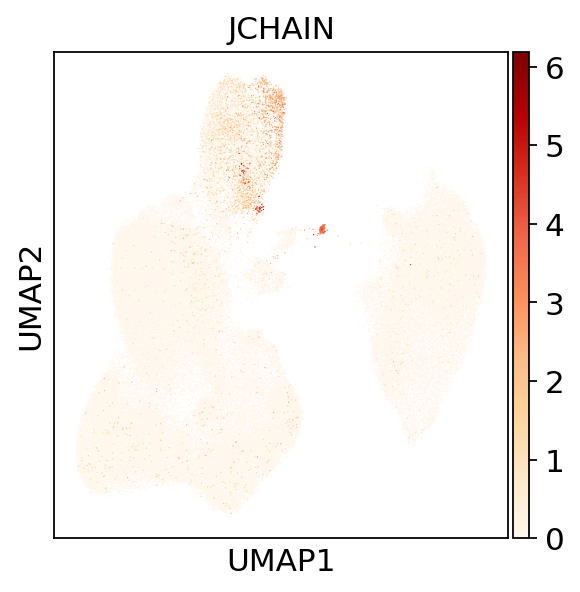

In [22]:
# plasma cells? (JCHAIN is also expr in pDCs)
sc.pl.umap(adata, color=['JCHAIN'], cmap='OrRd', use_raw=True,
           #legend_loc='on data',
           
          )

In [35]:
# need to zoom in on: 16, 4, 11, 17

In [27]:

%%time
sc.tl.louvain(adata, resolution=1.0,
             restrict_to=('louvain',['16']),
             key_added='louvain_R_16')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 34 clusters and added
    'louvain_R_16', the cluster labels (adata.obs, categorical) (0:00:00)
CPU times: user 360 ms, sys: 4 ms, total: 364 ms
Wall time: 363 ms


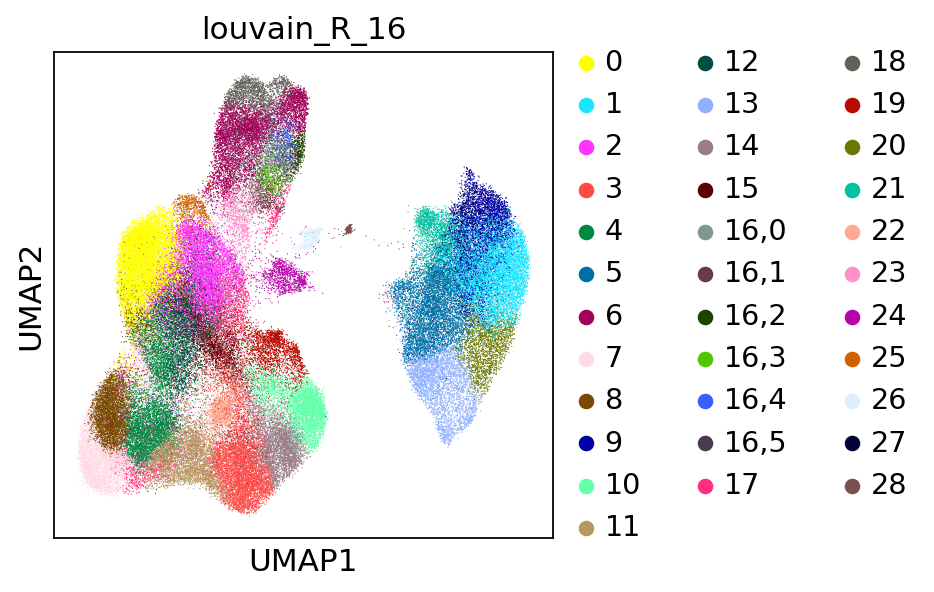

In [28]:
sc.pl.umap(adata, color=['louvain_R_16'], 
           #legend_loc='on data',
          )

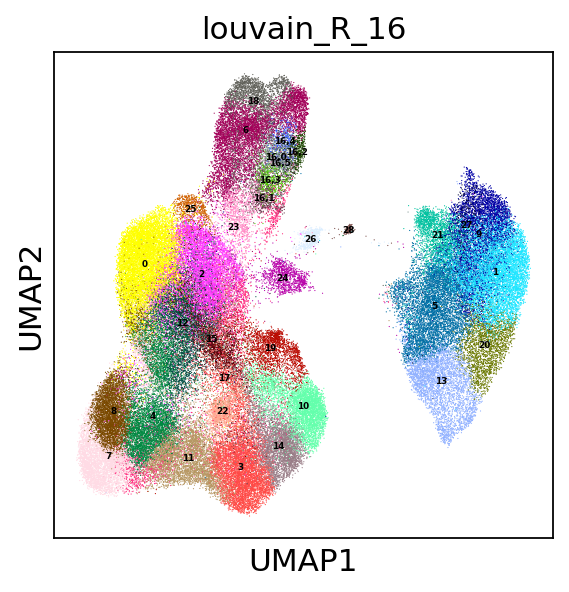

In [29]:
sc.pl.umap(adata, color=['louvain_R_16'], 
           legend_loc='on data',
           #legend_fontweight='light',
           legend_fontsize=4,
          )

In [30]:
# 16,1 - plasma cells, rest (16,0; 16,2; 16,3; 16,4; 16,5) - B cells

In [31]:
%%time
sc.tl.louvain(adata, resolution=0.5,
             restrict_to=('louvain',['4']),
             key_added='louvain_R_4')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 31 clusters and added
    'louvain_R_4', the cluster labels (adata.obs, categorical) (0:00:00)
CPU times: user 748 ms, sys: 12 ms, total: 760 ms
Wall time: 756 ms


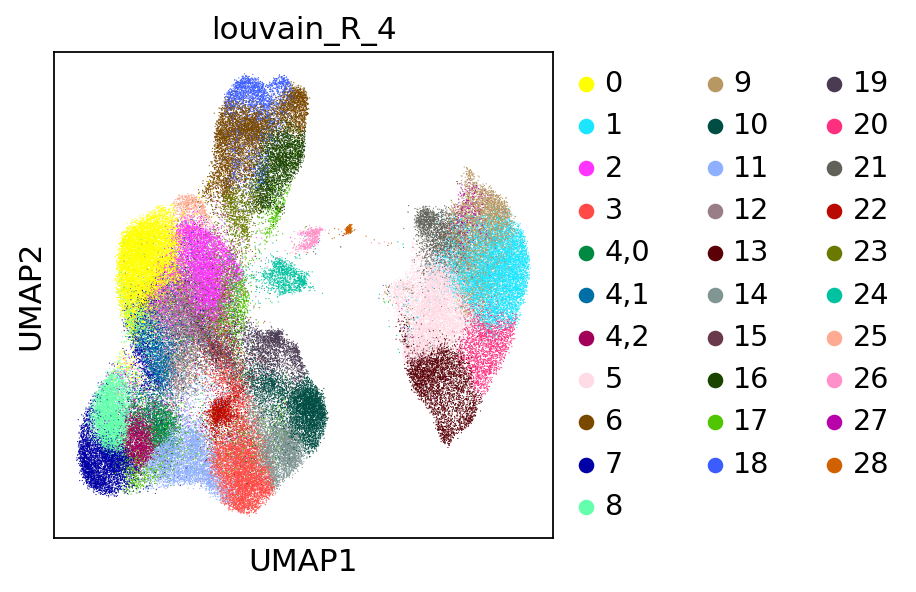

In [32]:
sc.pl.umap(adata, color=['louvain_R_4'], 
           #legend_loc='on data',
          )

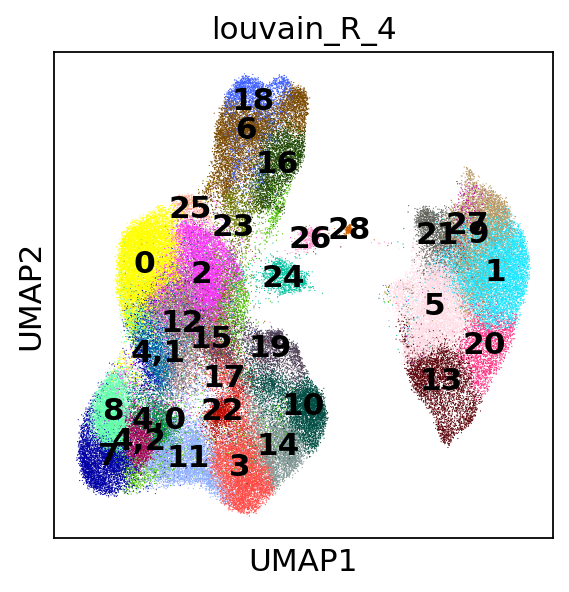

In [33]:
sc.pl.umap(adata, color=['louvain_R_4'], 
           legend_loc='on data',
          )

In [ ]:
# 4,1 - smth, rest - T4_memory

In [36]:
%%time
sc.tl.louvain(adata, resolution=0.6,
             restrict_to=('louvain',['11']),
             key_added='louvain_R_11')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 32 clusters and added
    'louvain_R_11', the cluster labels (adata.obs, categorical) (0:00:00)
CPU times: user 484 ms, sys: 12 ms, total: 496 ms
Wall time: 494 ms


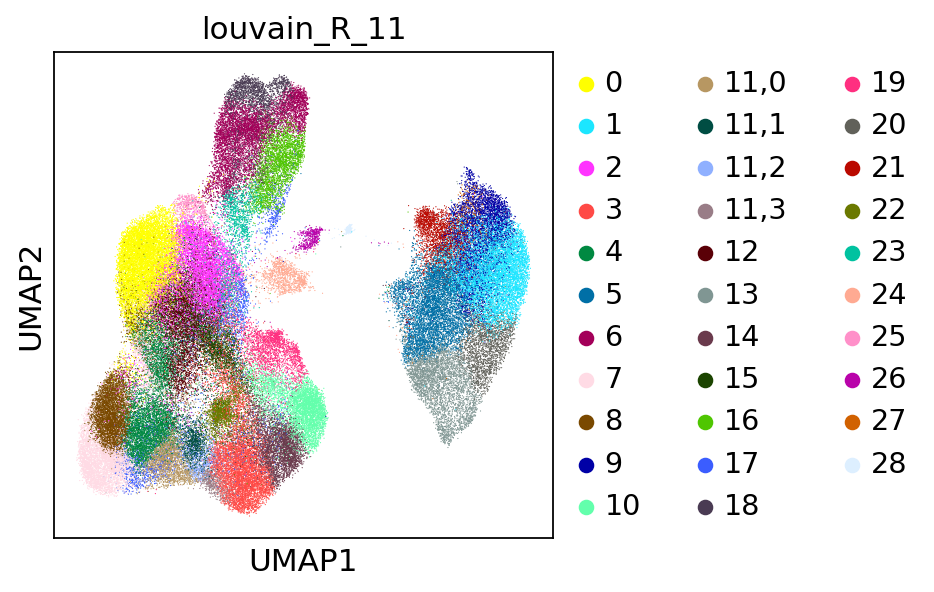

In [37]:
sc.pl.umap(adata, color=['louvain_R_11'], 
           #legend_loc='on data',
          )

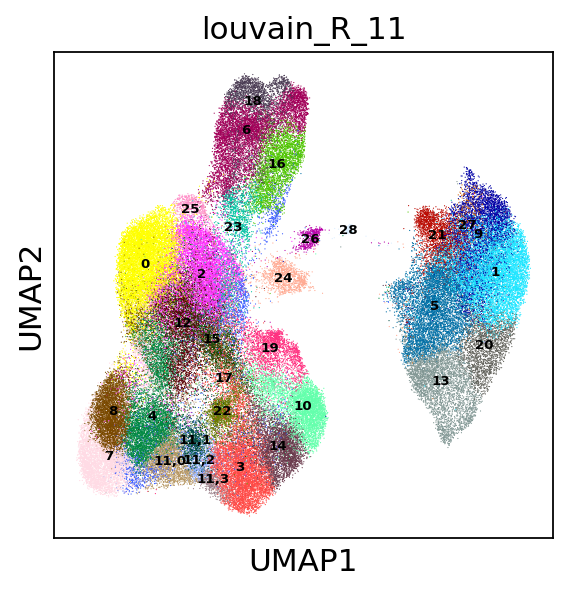

In [39]:
sc.pl.umap(adata, color=['louvain_R_11'], 
           legend_loc='on data',
           legend_fontsize=6
          )

In [40]:
# 11,1; 11,2 - MAIT cells
# 11,0 - T4_memory
# 11,3 - T8_memory

In [46]:
%%time
sc.tl.louvain(adata, resolution=0.5,
             restrict_to=('louvain',['17']),
             key_added='louvain_R_17')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 31 clusters and added
    'louvain_R_17', the cluster labels (adata.obs, categorical) (0:00:00)
CPU times: user 244 ms, sys: 0 ns, total: 244 ms
Wall time: 244 ms


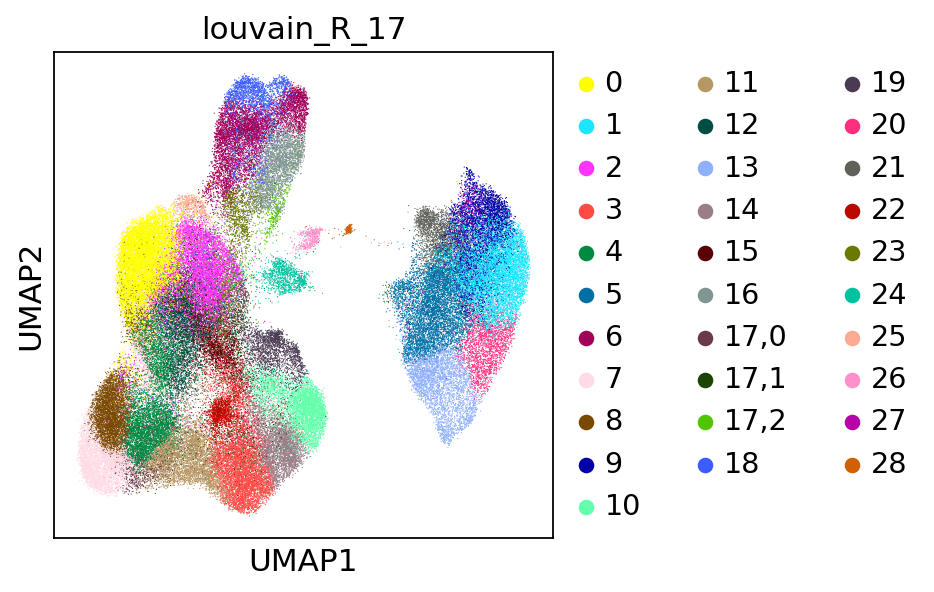

In [47]:
sc.pl.umap(adata, color=['louvain_R_17'], 
           #legend_loc='on data',
          )

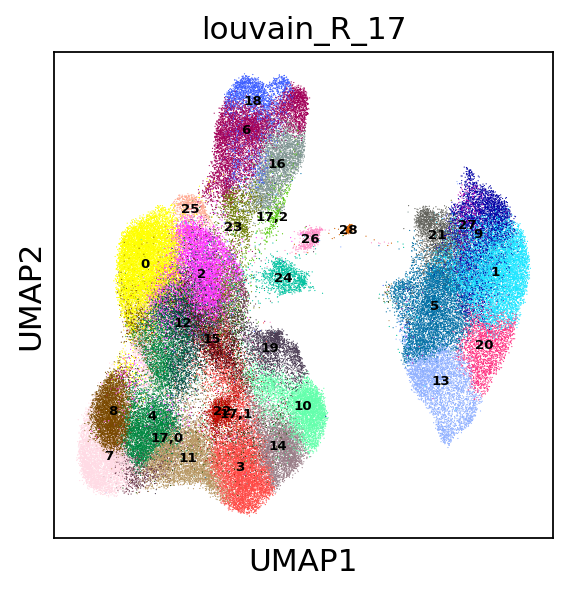

In [48]:
sc.pl.umap(adata, color=['louvain_R_17'], 
           legend_loc='on data',
           legend_fontsize=6,
          )

In [49]:
# 17,2 - B cells
# 17,0 - T4_naive
# 17,1 - iNKT cells

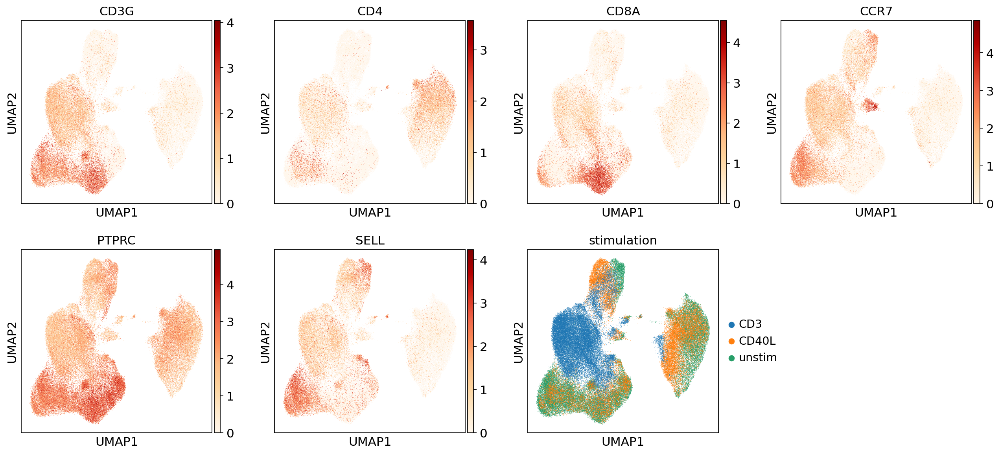

In [56]:
# memory T cells?
sc.pl.umap(adata, color=['CD3G',
                         'CD4', 'CD8A',
                         'CCR7',
                         'PTPRC', # CD45RO,
                         'SELL', # CD62L
                         'stimulation'
                        ], cmap='OrRd', use_raw=True)

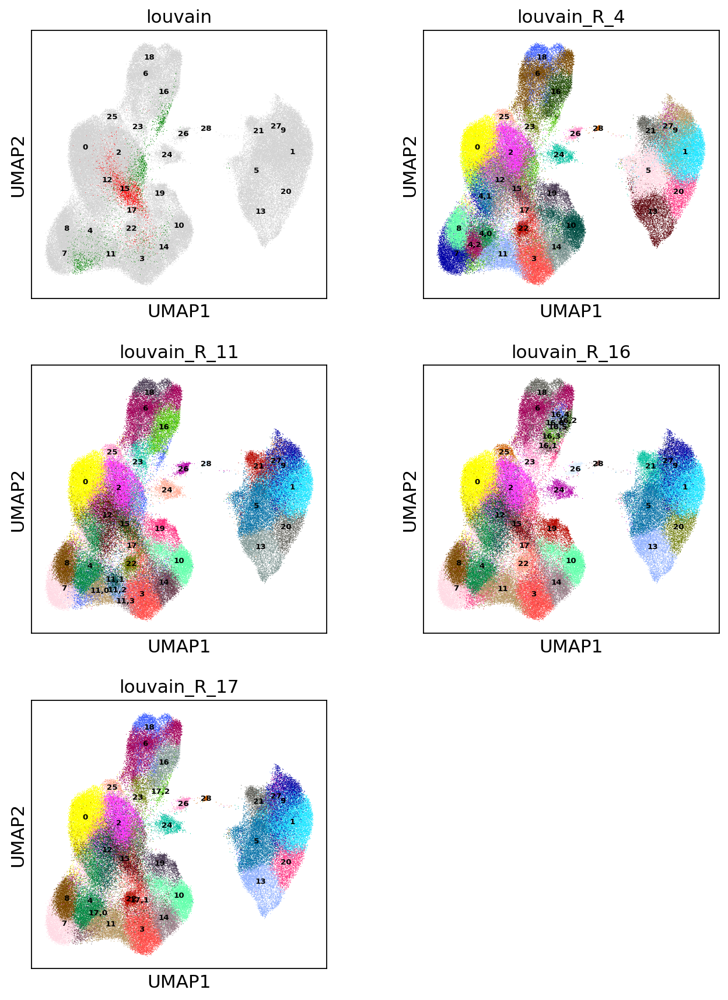

In [50]:
sc.pl.umap(adata, color=['louvain','louvain_R_4','louvain_R_11','louvain_R_16','louvain_R_17'], 
           ncols=2, legend_loc='on data', legend_fontsize=6)

# Preliminary annotation for SoupX

In [7]:
def annot_prelim(adata_obj, barcode):
    
    # coarse louvain labels
    
    curr_louvain_coarse = adata_obj.obs.loc[barcode,'louvain']
    
    
    if curr_louvain_coarse in ['6','18','23']:
        return('B_cells')
    elif curr_louvain_coarse == '4':
        # 4,1 - smth, rest - T4_memory
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_4']
        if zoomed_in_louvain == '4,1':
            return('T4_activated')
        elif zoomed_in_louvain in ['4,0','4,2']:
            return('T4_memory')
        else:
            return('not_assigned_4')
    
    
    elif curr_louvain_coarse == '11':
        # 11,1; 11,2 - MAIT cells
        # 11,0 - T4_memory
        # 11,3 - T8_memory
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_11']
        if zoomed_in_louvain == '11,0':
            return('T4_memory')
        elif zoomed_in_louvain == '11,3':
            return('T8_memory')
        elif zoomed_in_louvain in ['11,1','11,2']:
            return('MAIT_cells')
        else:
            return('not_assigned_11')
        
        
        
    elif curr_louvain_coarse == '16':
        # 16,1 - plasma cells, rest (16,0; 16,2; 16,3; 16,4; 16,5) - B cells
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_16']
        if zoomed_in_louvain == '16,1':
            return('plasma_cells')
        elif zoomed_in_louvain in ['16,0','16,2','16,3','16,4','16,5']:
            return('B_cells')
        else:
            return('not_assigned_16')
        
      
    elif curr_louvain_coarse == '17':
        # 17,2 - B cells
        # 17,0 - T4_naive
        # 17,1 - iNKT cells
        zoomed_in_louvain = adata_obj.obs.loc[barcode,'louvain_R_17']
        if zoomed_in_louvain == '17,2':
            return('B_cells')
        elif zoomed_in_louvain == '17,0':
            return('T4_naive')
        elif zoomed_in_louvain == '17,1':
            return('iNKT_cells')
        else:
            return('not_assigned_17')
        
    
    elif curr_louvain_coarse in ['0','25']:
        return('T4_activated')
    elif curr_louvain_coarse == '2':
        return('iNKT_cells')
    
    
    
    elif curr_louvain_coarse == '21':
        return('Monocytes_CD16+')
    elif curr_louvain_coarse in ['1','9','27']:
        return('Monocytes_classical')
    elif curr_louvain_coarse in ['13','20']:
        return('cDC2')
    elif curr_louvain_coarse == '5':
        return('Macrophages')
    
    elif curr_louvain_coarse == '28':
        return('pDCs')
    elif curr_louvain_coarse == '26':
        return('precursor_cells')
    elif curr_louvain_coarse == '24':
        return('cDC1')
    
    
    elif curr_louvain_coarse == '19':
        return('NK_CD56+')
    elif curr_louvain_coarse in ['10','14']:
        return('NK_CD16+')
    
    elif curr_louvain_coarse == '3':
        return('T8_memory')
    
    elif curr_louvain_coarse == '15':
        return('T8_activated')
    
    elif curr_louvain_coarse == '22':
        return('T_gd')
    
    elif curr_louvain_coarse == '12':
        return('T4_activated')
    
    elif curr_louvain_coarse == '7':
        return('T8_naive')
    elif curr_louvain_coarse == '8':
        return('T4_naive')
    
        
    
    
    else:
        return('not_assigned')
    

In [8]:
adata.obs['barcode'] = adata.obs.index

In [9]:
adata.obs['prelim_annot'] = adata.obs['barcode'].apply(lambda x: annot_prelim(adata,x))

... storing 'prelim_annot' as categorical


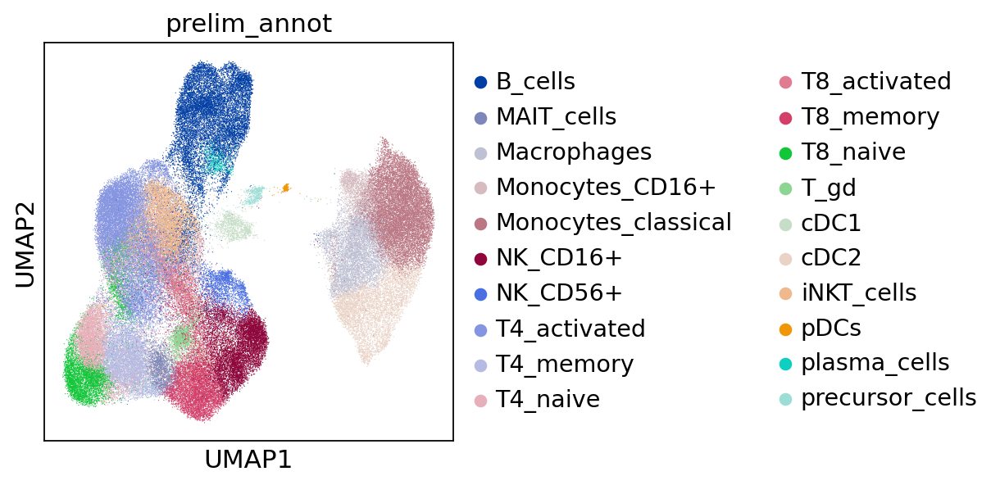

In [10]:
sc.pl.umap(adata, color='prelim_annot')

In [11]:
adata.write(save_path+'adata_hvg_BBKNN_GEX_only_fully_proc_prelim_annot_validation_cohort_20210212.h5ad')

In [12]:
adata

AnnData object with n_obs × n_vars = 107050 × 2791
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase', 'probabilities', 'celltype_predictions', 'louvain', 'louvain_R_16', 'louvain_R_4', 'louvain_R_11', 'louvain_R_3', 'louvain_R_17', 'barcode', 'prelim_annot'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispe

In [13]:
# to get the barcode-sample column stored here as 'cell_id'
#adata_raw_filtered = sc.read(save_path+'adata_raw_filtered.h5ad')

In [14]:
adata.obs['barcode_sample'] = adata.obs['cell_id']

In [15]:
adata.obs['prelim_annot']

index
AAACCTGAGAATGTGT-1      Monocytes_classical
AAACCTGAGACTAAGT-1                     cDC2
AAACCTGAGCCGCCTA-1               MAIT_cells
AAACCTGAGCGCCTCA-1                T8_memory
AAACCTGAGGATGTAT-1                T8_memory
                               ...         
TTTGTCATCCCTTGCA-1-1               T4_naive
TTTGTCATCCGCGTTT-1                  B_cells
TTTGTCATCGGAGGTA-1                  B_cells
TTTGTCATCGGCTACG-1-1               NK_CD56+
TTTGTCATCTTGGGTA-1                  B_cells
Name: prelim_annot, Length: 107050, dtype: category
Categories (20, object): [B_cells, MAIT_cells, Macrophages, Monocytes_CD16+, ..., iNKT_cells, pDCs, plasma_cells, precursor_cells]

In [16]:
adata.obs

,batch,bh_pval,cell_id,dataset,n_counts,n_genes,percent_mito,sample,scrublet_cluster_score,scrublet_score,...,celltype_predictions,louvain,louvain_R_16,louvain_R_4,louvain_R_11,louvain_R_3,louvain_R_17,barcode,prelim_annot,barcode_sample
index,,,,,,,,,,,,,,,,,,,,,
AAACCTGAGAATGTGT-1,0,0.889727,AAACCTGAGAATGTGT-1_35008_CV005_RV9039258_and_3...,GEX+CITE-seq,6589.0,2702,0.018107,35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.121951,0.228916,...,Monocytes_CD16+,9,9,9,9,9,9,AAACCTGAGAATGTGT-1,Monocytes_classical,AAACCTGAGAATGTGT-1_35008_CV005_RV9039258_and_3...
AAACCTGAGACTAAGT-1,0,0.889727,AAACCTGAGACTAAGT-1_35008_CV005_RV9039258_and_3...,GEX+CITE-seq,10531.0,3009,0.039083,35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.101341,0.109890,...,cDC2,13,13,13,13,13,13,AAACCTGAGACTAAGT-1,cDC2,AAACCTGAGACTAAGT-1_35008_CV005_RV9039258_and_3...
AAACCTGAGCCGCCTA-1,0,0.889727,AAACCTGAGCCGCCTA-1_35008_CV005_RV9039258_and_3...,GEX+CITE-seq,967.0,630,0.039246,35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.097384,0.045720,...,TCM_CD8+,11,11,11,"11,1",11,11,AAACCTGAGCCGCCTA-1,MAIT_cells,AAACCTGAGCCGCCTA-1_35008_CV005_RV9039258_and_3...
AAACCTGAGCGCCTCA-1,0,0.889727,AAACCTGAGCGCCTCA-1_35008_CV005_RV9039258_and_3...,GEX+CITE-seq,829.0,629,0.028144,35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.081753,0.142056,...,TMRA_CD8+,3,3,3,3,"3,0",3,AAACCTGAGCGCCTCA-1,T8_memory,AAACCTGAGCGCCTCA-1_35008_CV005_RV9039258_and_3...
AAACCTGAGGATGTAT-1,0,0.889727,AAACCTGAGGATGTAT-1_35008_CV005_RV9039258_and_3...,GEX+CITE-seq,752.0,571,0.015311,35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.072961,0.044019,...,TEM_CD8+,3,3,3,3,"3,1",3,AAACCTGAGGATGTAT-1,T8_memory,AAACCTGAGGATGTAT-1_35008_CV005_RV9039258_and_3...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCCCTTGCA-1-1,8,0.871054,TTTGTCATCCCTTGCA-1_35171_CV005_RV9039363,GEX+CITE-seq,4579.0,2240,0.052581,35171_CV005_RV9039363,0.097230,0.584296,...,iNKT_cells,17,17,17,17,17,"17,0",TTTGTCATCCCTTGCA-1-1,T4_naive,TTTGTCATCCCTTGCA-1_35171_CV005_RV9039363
TTTGTCATCCGCGTTT-1,8,0.949569,TTTGTCATCCGCGTTT-1_35171_CV005_RV9039363,GEX+CITE-seq,1604.0,1066,0.014229,35171_CV005_RV9039363,0.076029,0.024129,...,B_cells_naive,6,6,6,6,6,6,TTTGTCATCCGCGTTT-1,B_cells,TTTGTCATCCGCGTTT-1_35171_CV005_RV9039363
TTTGTCATCGGAGGTA-1,8,0.949569,TTTGTCATCGGAGGTA-1_35171_CV005_RV9039363,GEX+CITE-seq,1643.0,1076,0.010137,35171_CV005_RV9039363,0.038408,0.020513,...,B_cells_naive,6,6,6,6,6,6,TTTGTCATCGGAGGTA-1,B_cells,TTTGTCATCGGAGGTA-1_35171_CV005_RV9039363


In [17]:
for sample in np.unique(adata.obs['sample']):
    print(sample)
    curr_data = adata[adata.obs['sample'] == sample]
    #print(curr_data)
    annot_df = pd.DataFrame(index=curr_data.obs['cell_id'])
    annot_df['cell_type'] = list(curr_data.obs['prelim_annot'])
    #print(annot_df.index)
    annot_df.index = [elem.split('_')[0] for elem in annot_df.index]
    #print(annot_df)
    annot_df.to_csv('./annot_tables_for_SoupX/20210212_prelim_annot_all_samples_annot_sample_'+sample+'_validation_cohort.csv')

35008_CV005_RV9039258_and_35008_CV005_RV9039282
35008_CV005_RV9039259_and_35008_CV005_RV9039283
35008_CV005_RV9039260_and_35008_CV005_RV9039284
35008_CV005_RV9039261_and_35008_CV005_RV9039285
35008_CV005_RV9039262_and_35008_CV005_RV9039286
35008_CV005_RV9039263_and_35008_CV005_RV9039287
35171_CV005_RV9039361
35171_CV005_RV9039362
35171_CV005_RV9039363


In [6]:
adata = sc.read(save_path+'adata_hvg_BBKNN_GEX_only_fully_proc_prelim_annot_validation_cohort_20210212.h5ad')

# Plotting normalised and log transformed protein conts on top of GEX-only manifold

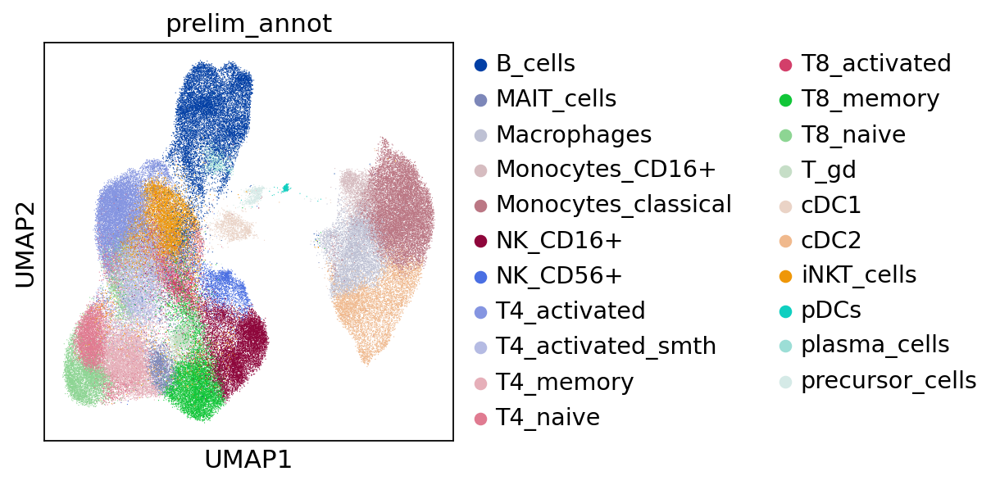

In [74]:
sc.pl.umap(adata, color='prelim_annot')

In [75]:
# reading the raw adata with protein and gex counts
adata_raw = sc.read(save_path + 'adata_raw_filtered_validation_cohort.h5ad')

In [76]:
adata_raw.var

,gene_ids-0,feature_types-0,genome-0,n_cells-0,gene_ids-1,feature_types-1,genome-1,n_cells-1,gene_ids-2,feature_types-2,...,genome-6,n_cells-6,gene_ids-7,feature_types-7,genome-7,n_cells-7,gene_ids-8,feature_types-8,genome-8,n_cells-8
index,,,,,,,,,,,,,,,,,,,,,
RP11-34P13.7,ENSG00000238009,Gene Expression,GRCh38,4.0,nan,nan,nan,NaN,ENSG00000238009,Gene Expression,...,GRCh38,11.0,ENSG00000238009,Gene Expression,GRCh38,13.0,ENSG00000238009,Gene Expression,GRCh38,13.0
FO538757.2,ENSG00000279457,Gene Expression,GRCh38,1556.0,ENSG00000279457,Gene Expression,GRCh38,1888.0,ENSG00000279457,Gene Expression,...,GRCh38,4502.0,ENSG00000279457,Gene Expression,GRCh38,5598.0,ENSG00000279457,Gene Expression,GRCh38,4835.0
AP006222.2,ENSG00000228463,Gene Expression,GRCh38,26.0,ENSG00000228463,Gene Expression,GRCh38,24.0,ENSG00000228463,Gene Expression,...,GRCh38,95.0,ENSG00000228463,Gene Expression,GRCh38,90.0,ENSG00000228463,Gene Expression,GRCh38,55.0
RP4-669L17.10,ENSG00000237094,Gene Expression,GRCh38,18.0,ENSG00000237094,Gene Expression,GRCh38,14.0,ENSG00000237094,Gene Expression,...,GRCh38,42.0,ENSG00000237094,Gene Expression,GRCh38,60.0,ENSG00000237094,Gene Expression,GRCh38,47.0
RP5-857K21.4,ENSG00000230021,Gene Expression,GRCh38,4.0,ENSG00000230021,Gene Expression,GRCh38,4.0,ENSG00000230021,Gene Expression,...,GRCh38,8.0,ENSG00000230021,Gene Expression,GRCh38,13.0,ENSG00000230021,Gene Expression,GRCh38,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTD-2541M15.3,nan,nan,nan,NaN,nan,nan,nan,NaN,nan,nan,...,nan,NaN,nan,nan,nan,NaN,ENSG00000271743,Gene Expression,GRCh38,3.0
THEGL,nan,nan,nan,NaN,nan,nan,nan,NaN,ENSG00000249693,Gene Expression,...,GRCh38,3.0,nan,nan,nan,NaN,ENSG00000249693,Gene Expression,GRCh38,8.0
KIAA1644,nan,nan,nan,NaN,nan,nan,nan,NaN,ENSG00000138944,Gene Expression,...,nan,NaN,ENSG00000138944,Gene Expression,GRCh38,12.0,nan,nan,nan,NaN


In [77]:
adata_raw.var['feature_types-0'].value_counts()

Gene Expression     17254
nan                  4303
Antibody Capture      192
Name: feature_types-0, dtype: int64

In [78]:
adata_protein = adata_raw[:, adata_raw.var['feature_types-0'] == 'Antibody Capture'].copy()


In [79]:
adata_protein.obs

,batch,bh_pval,cell_id,dataset,n_counts,n_genes,percent_mito,sample,scrublet_cluster_score,scrublet_score,stimulation,technique,is_doublet,donor
index,,,,,,,,,,,,,,
AAACCTGAGAATGTGT-1,0,0.889727,AAACCTGAGAATGTGT-1_35008_CV005_RV9039258_and_3...,GEX+CITE-seq,7290.0,2702,0.018107,35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.121951,0.228916,unstim,10X,False,CVID3
AAACCTGAGACTAAGT-1,0,0.889727,AAACCTGAGACTAAGT-1_35008_CV005_RV9039258_and_3...,GEX+CITE-seq,12742.0,3009,0.039083,35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.101341,0.109890,unstim,10X,False,CONTROL4
AAACCTGAGCCGCCTA-1,0,0.889727,AAACCTGAGCCGCCTA-1_35008_CV005_RV9039258_and_3...,GEX+CITE-seq,1274.0,630,0.039246,35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.097384,0.045720,unstim,10X,False,CVID3
AAACCTGAGCGCCTCA-1,0,0.889727,AAACCTGAGCGCCTCA-1_35008_CV005_RV9039258_and_3...,GEX+CITE-seq,1137.0,629,0.028144,35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.081753,0.142056,unstim,10X,False,CVID33
AAACCTGAGGATGTAT-1,0,0.889727,AAACCTGAGGATGTAT-1_35008_CV005_RV9039258_and_3...,GEX+CITE-seq,1045.0,571,0.015311,35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.072961,0.044019,unstim,10X,False,CVID3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCCCTTGCA-1-1,8,0.871054,TTTGTCATCCCTTGCA-1_35171_CV005_RV9039363,GEX+CITE-seq,10308.0,2240,0.052581,35171_CV005_RV9039363,0.097230,0.584296,CD3,10X,False,CVID25
TTTGTCATCCGCGTTT-1,8,0.949569,TTTGTCATCCGCGTTT-1_35171_CV005_RV9039363,GEX+CITE-seq,3022.0,1066,0.014229,35171_CV005_RV9039363,0.076029,0.024129,CD3,10X,False,CVID23
TTTGTCATCGGAGGTA-1,8,0.949569,TTTGTCATCGGAGGTA-1_35171_CV005_RV9039363,GEX+CITE-seq,3058.0,1076,0.010137,35171_CV005_RV9039363,0.038408,0.020513,CD3,10X,False,CVID25


In [80]:
# saving raw into the attribute
adata_protein.raw = adata_protein.copy()

# normalising and log transforming the protein counts
sc.pp.normalize_per_cell(adata_protein, counts_per_cell_after=1e4)
sc.pp.log1p(adata_protein)

normalizing by total count per cell
    finished (0:00:08): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [81]:
# subsetting to only final cells from adata
adata_protein = adata_protein[adata.obs_names,:].copy()

In [82]:
np.unique(adata_protein.obs_names == adata.obs_names)

array([ True])

In [83]:
Ab_list = list(adata_protein.var_names)

In [84]:
protein_counts = pd.DataFrame(data = adata_protein.X.todense(),
                             index = adata_protein.obs_names,
                             columns = adata_protein.var_names)

In [85]:
protein_counts

index,CD80-1,CD86-1,CD274(B7-H1),CD273(B7-DC),CD275(B7-H2),CD11b,CD252(OX40L),CD137L(4-1BBLigand),CD155(PVR),CD112(Nectin-2),...,CD101(BB27),CD360(IL-21R),CD88(C5aR),HLA-F-1,NLRP2-1,Podocalyxin,CD224,anti-c-Met,CD258(LIGHT),DR3(TRAMP)
index,,,,,,,,,,,,,,,,,,,,,
AAACCTGAGAATGTGT-1,2.725585,3.385429,0.000000,2.725585,3.385429,5.879508,0.000000,4.281193,4.061500,4.461207,...,5.370545,3.385429,6.297262,0.000000,4.061500,3.385429,4.613707,3.385429,3.385429,0.000000
AAACCTGAGACTAAGT-1,3.730635,2.949236,3.161848,3.337087,1.708892,2.678863,1.708892,3.161848,3.730635,2.678863,...,4.813133,3.161848,4.813133,4.090954,4.090954,3.337087,4.411721,4.012304,3.730635,4.090954
AAACCTGAGCCGCCTA-1,0.000000,0.000000,4.191873,4.592286,3.513731,4.877433,3.513731,0.000000,0.000000,0.000000,...,5.566764,4.191873,0.000000,0.000000,4.592286,0.000000,4.191873,4.191873,0.000000,4.191873
AAACCTGAGCGCCTCA-1,0.000000,0.000000,3.510576,0.000000,3.510576,5.277120,3.510576,3.510576,3.510576,0.000000,...,4.589067,0.000000,3.510576,0.000000,4.874206,0.000000,0.000000,3.510576,0.000000,3.510576
AAACCTGAGGATGTAT-1,0.000000,0.000000,4.638499,0.000000,3.559047,4.923760,0.000000,0.000000,3.559047,0.000000,...,5.480255,0.000000,4.638499,3.559047,3.559047,3.559047,3.559047,4.237859,0.000000,4.237859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCCCTTGCA-1-1,3.165119,0.000000,3.717142,2.581620,2.274960,3.798577,2.077192,2.815980,1.830422,2.077192,...,2.815980,1.830422,3.873878,3.531190,3.531190,2.274960,4.500041,3.302576,2.915338,3.364813
TTTGTCATCCGCGTTT-1,3.374468,2.085944,3.374468,3.374468,2.085944,4.050349,2.085944,3.919302,2.085944,3.374468,...,2.714984,2.714984,3.098134,3.590741,4.449992,0.000000,3.374468,3.098134,3.768456,3.919302
TTTGTCATCGGAGGTA-1,3.592800,0.000000,2.087799,0.000000,2.716962,3.770525,2.087799,3.100156,3.376514,3.100156,...,2.087799,2.716962,3.100156,2.087799,4.853658,2.716962,3.376514,3.100156,3.921378,3.770525


In [86]:
for Ab in Ab_list:
    print('adding', Ab, 'normalised and log transformed counts')
    adata.obs[Ab+'_protein'] = protein_counts.loc[adata.obs_names,Ab]

adding CD80-1 normalised and log transformed counts
adding CD86-1 normalised and log transformed counts
adding CD274(B7-H1) normalised and log transformed counts
adding CD273(B7-DC) normalised and log transformed counts
adding CD275(B7-H2) normalised and log transformed counts
adding CD11b normalised and log transformed counts
adding CD252(OX40L) normalised and log transformed counts
adding CD137L(4-1BBLigand) normalised and log transformed counts
adding CD155(PVR) normalised and log transformed counts
adding CD112(Nectin-2) normalised and log transformed counts
adding CD47-1 normalised and log transformed counts
adding CD70-1 normalised and log transformed counts
adding CD30 normalised and log transformed counts
adding CD40-1 normalised and log transformed counts
adding CD154 normalised and log transformed counts
adding CD52-1 normalised and log transformed counts
adding CD3 normalised and log transformed counts
adding CD8 normalised and log transformed counts
adding CD56(NCAM) normal

In [87]:
Ab_list_obs = [Ab + '_protein' for Ab in Ab_list]

In [ ]:
%%time

# this plot is saved into: ./figures/umap_normlog_protein_counts_on_GEX-only_manifold_validation_cohort_20210212.pdf
# takes about 9 minutes to plot this

sc.pl.umap(adata, color = Ab_list_obs + ['prelim_annot'], 
           cmap='OrRd',
           save = '_normlog_protein_counts_on_GEX-only_manifold_validation_cohort_20210212.pdf')

# Now plotting protein counts denoised by SoupX on top of the same GEX-only manifold

In [18]:
samples = np.unique(adata.obs['sample'])
samples

array(['35008_CV005_RV9039258_and_35008_CV005_RV9039282',
       '35008_CV005_RV9039259_and_35008_CV005_RV9039283',
       '35008_CV005_RV9039260_and_35008_CV005_RV9039284',
       '35008_CV005_RV9039261_and_35008_CV005_RV9039285',
       '35008_CV005_RV9039262_and_35008_CV005_RV9039286',
       '35008_CV005_RV9039263_and_35008_CV005_RV9039287',
       '35171_CV005_RV9039361', '35171_CV005_RV9039362',
       '35171_CV005_RV9039363'], dtype=object)

In [19]:
# reading SoupX corrected protein counts (raw)
soupx_denoised_prot = {}

for sample in samples:
    print(sample)
    soupx_denoised_prot[sample] = pd.read_csv('/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/20210212_counts_denoised_with_SoupX_sample_' + sample + '.csv',
                                             index_col=0)
    # getting the barcode indexing to look like the 'cell_id' column in the adata.obs table
    soupx_denoised_prot[sample].columns = [elem.replace('.','-') + '_' + sample for elem in soupx_denoised_prot[sample].columns]
    soupx_denoised_prot[sample] = soupx_denoised_prot[sample].T

35008_CV005_RV9039258_and_35008_CV005_RV9039282
35008_CV005_RV9039259_and_35008_CV005_RV9039283
35008_CV005_RV9039260_and_35008_CV005_RV9039284
35008_CV005_RV9039261_and_35008_CV005_RV9039285
35008_CV005_RV9039262_and_35008_CV005_RV9039286
35008_CV005_RV9039263_and_35008_CV005_RV9039287
35171_CV005_RV9039361
35171_CV005_RV9039362
35171_CV005_RV9039363


In [20]:
soupx_denoised_prot['35171_CV005_RV9039361']

,CD80.1,CD86.1,CD274(B7-H1),CD273(B7-DC),CD275(B7-H2),CD11b,CD252(OX40L),CD137L(4-1BBLigand),CD155(PVR),CD112(Nectin-2),...,CD101(BB27),CD360(IL-21R),CD88(C5aR),HLA-F.1,NLRP2.1,Podocalyxin,CD224,anti-c-Met,CD258(LIGHT),DR3(TRAMP)
AAACCTGAGAAGATTC-1_35171_CV005_RV9039361,2.409737,0.0,0.000000,0.000000,0.000000,5.344515,0.000000,2.770212,2.413521,2.478966,...,0.0,0.000000,0.0,1.910821,1.320151,0.342471,2.075364,0.000000,0.000000,0.000000
AAACCTGAGATAGTCA-1_35171_CV005_RV9039361,3.573292,0.0,0.298514,5.841577,0.298222,6.585768,0.000000,0.000000,0.000000,2.053111,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,3.595052,0.000000,0.000000,0.000000
AAACCTGAGCAGACTG-1_35171_CV005_RV9039361,1.036235,0.0,0.000000,0.000000,0.000000,16.967227,2.458255,0.000000,0.000000,4.980162,...,0.0,0.000000,0.0,5.669404,1.705416,0.999442,2.024555,0.000000,0.745896,2.606060
AAACCTGAGCCAGAAC-1_35171_CV005_RV9039361,5.040643,0.0,0.000000,0.000000,0.000000,5.969301,0.762144,0.651484,0.000000,0.000000,...,0.0,0.000000,0.0,1.028323,3.288194,1.094817,0.000000,3.346926,0.000000,1.392955
AAACCTGAGCCCTAAT-1_35171_CV005_RV9039361,0.335965,0.0,0.000000,0.000000,0.012891,7.307755,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.0,4.148650,6.519322,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCACTCCTG-1_35171_CV005_RV9039361,9.487103,0.0,0.000000,0.000000,0.000000,2.123793,0.574694,0.618591,0.000000,2.291075,...,0.0,0.000000,0.0,1.521992,8.798271,4.259874,0.000000,0.000000,0.000000,4.320186
TTTGTCATCAGGCCCA-1_35171_CV005_RV9039361,0.000000,0.0,0.000000,0.000000,0.000000,3.037424,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.0,0.000000,0.000000,0.551354,0.000000,0.000000,0.000000,1.158395
TTTGTCATCTACCAGA-1_35171_CV005_RV9039361,2.644065,0.0,0.887835,0.847846,0.668279,14.907914,0.000000,0.000000,0.000000,0.433838,...,0.0,2.173384,0.0,0.000000,0.000000,0.000000,1.372189,0.000000,0.000000,0.000000
TTTGTCATCTCATTCA-1_35171_CV005_RV9039361,0.951533,0.0,0.000000,0.000000,0.000000,0.000000,1.421148,0.000000,0.000000,0.000000,...,0.0,0.000000,0.0,4.522039,0.000000,1.939769,0.000000,4.058006,0.603347,0.000000


In [21]:
soupx_denoised_prot_joint_table = pd.concat(list(soupx_denoised_prot.values()))

In [22]:
soupx_denoised_prot_joint_table

,CD80.1,CD86.1,CD274(B7-H1),CD273(B7-DC),CD275(B7-H2),CD11b,CD252(OX40L),CD137L(4-1BBLigand),CD155(PVR),CD112(Nectin-2),...,CD101(BB27),CD360(IL-21R),CD88(C5aR),HLA-F.1,NLRP2.1,Podocalyxin,CD224,anti-c-Met,CD258(LIGHT),DR3(TRAMP)
AAACCTGAGAATGTGT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,1.533831,0.000000,0.000000,0.000000,17.246043,0.000000,2.002305,2.248118,4.232278,...,10.184110,0.500351,32.863840,0.000000,0.000000,0.000000,4.667795,0.000000,0.000000,0.000000
AAACCTGAGACTAAGT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,1.655727,2.826156,0.000000,2.254152,0.000000,0.000000,0.000000,0.000000,3.248333,0.000000,...,10.629308,0.000000,9.392276,0.000000,0.000000,0.000000,10.429329,0.000000,0.000000,0.000000
AAACCTGAGCCGCCTA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,0.805469,2.115785,0.000000,0.865683,0.372383,0.000000,0.000000,0.000000,...,5.758597,1.175540,0.000000,0.000000,1.474611,0.000000,0.904696,0.772919,0.000000,0.618679
AAACCTGAGCGCCTCA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,0.000000,0.000000,0.153741,2.645492,0.412204,0.043668,0.000000,0.000000,...,0.576866,0.000000,0.000000,0.000000,2.484107,0.000000,0.000000,0.000000,0.000000,0.000000
AAACCTGAGGATGTAT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,2.006234,0.000000,0.194955,0.808861,0.000000,0.000000,0.000000,0.000000,...,4.694875,0.000000,0.000000,0.000000,0.000000,0.188552,0.000000,0.875976,0.000000,0.709547
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCCCTTGCA-1_35171_CV005_RV9039363,4.751022,0.000000,0.000000,0.000000,0.000000,5.935854,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,12.065276,5.615428,0.000000,0.000000,31.023987,0.985559,2.577475,0.000000
TTTGTCATCCGCGTTT-1_35171_CV005_RV9039363,2.012104,0.283824,0.000000,2.011435,0.000000,2.706799,0.000000,4.369925,0.000000,1.209127,...,0.000000,0.382284,0.000000,1.571716,5.859170,0.000000,0.000000,0.000000,4.095515,2.392394
TTTGTCATCGGAGGTA-1_35171_CV005_RV9039363,3.016310,0.000000,0.000000,0.000000,0.125238,0.717997,0.000000,0.375489,0.031817,0.215031,...,0.000000,0.385706,0.000000,0.000000,11.872162,0.151275,0.000000,0.000000,5.099544,1.402142
TTTGTCATCGGCTACG-1_35171_CV005_RV9039363,2.160729,0.000000,0.000000,0.000000,4.452726,12.631291,1.152827,0.651164,1.339122,0.823337,...,0.000000,1.692116,6.579794,1.646557,0.000000,0.000000,0.000000,5.316219,4.508857,5.464297


In [23]:
soupx_denoised_prot_joint_table.columns = [elem + '_protein_denoised_SoupX' for elem in soupx_denoised_prot_joint_table.columns]

In [24]:
soupx_denoised_prot_joint_table

,CD80.1_protein_denoised_SoupX,CD86.1_protein_denoised_SoupX,CD274(B7-H1)_protein_denoised_SoupX,CD273(B7-DC)_protein_denoised_SoupX,CD275(B7-H2)_protein_denoised_SoupX,CD11b_protein_denoised_SoupX,CD252(OX40L)_protein_denoised_SoupX,CD137L(4-1BBLigand)_protein_denoised_SoupX,CD155(PVR)_protein_denoised_SoupX,CD112(Nectin-2)_protein_denoised_SoupX,...,CD101(BB27)_protein_denoised_SoupX,CD360(IL-21R)_protein_denoised_SoupX,CD88(C5aR)_protein_denoised_SoupX,HLA-F.1_protein_denoised_SoupX,NLRP2.1_protein_denoised_SoupX,Podocalyxin_protein_denoised_SoupX,CD224_protein_denoised_SoupX,anti-c-Met_protein_denoised_SoupX,CD258(LIGHT)_protein_denoised_SoupX,DR3(TRAMP)_protein_denoised_SoupX
AAACCTGAGAATGTGT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,1.533831,0.000000,0.000000,0.000000,17.246043,0.000000,2.002305,2.248118,4.232278,...,10.184110,0.500351,32.863840,0.000000,0.000000,0.000000,4.667795,0.000000,0.000000,0.000000
AAACCTGAGACTAAGT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,1.655727,2.826156,0.000000,2.254152,0.000000,0.000000,0.000000,0.000000,3.248333,0.000000,...,10.629308,0.000000,9.392276,0.000000,0.000000,0.000000,10.429329,0.000000,0.000000,0.000000
AAACCTGAGCCGCCTA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,0.805469,2.115785,0.000000,0.865683,0.372383,0.000000,0.000000,0.000000,...,5.758597,1.175540,0.000000,0.000000,1.474611,0.000000,0.904696,0.772919,0.000000,0.618679
AAACCTGAGCGCCTCA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,0.000000,0.000000,0.153741,2.645492,0.412204,0.043668,0.000000,0.000000,...,0.576866,0.000000,0.000000,0.000000,2.484107,0.000000,0.000000,0.000000,0.000000,0.000000
AAACCTGAGGATGTAT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,2.006234,0.000000,0.194955,0.808861,0.000000,0.000000,0.000000,0.000000,...,4.694875,0.000000,0.000000,0.000000,0.000000,0.188552,0.000000,0.875976,0.000000,0.709547
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCCCTTGCA-1_35171_CV005_RV9039363,4.751022,0.000000,0.000000,0.000000,0.000000,5.935854,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,12.065276,5.615428,0.000000,0.000000,31.023987,0.985559,2.577475,0.000000
TTTGTCATCCGCGTTT-1_35171_CV005_RV9039363,2.012104,0.283824,0.000000,2.011435,0.000000,2.706799,0.000000,4.369925,0.000000,1.209127,...,0.000000,0.382284,0.000000,1.571716,5.859170,0.000000,0.000000,0.000000,4.095515,2.392394
TTTGTCATCGGAGGTA-1_35171_CV005_RV9039363,3.016310,0.000000,0.000000,0.000000,0.125238,0.717997,0.000000,0.375489,0.031817,0.215031,...,0.000000,0.385706,0.000000,0.000000,11.872162,0.151275,0.000000,0.000000,5.099544,1.402142
TTTGTCATCGGCTACG-1_35171_CV005_RV9039363,2.160729,0.000000,0.000000,0.000000,4.452726,12.631291,1.152827,0.651164,1.339122,0.823337,...,0.000000,1.692116,6.579794,1.646557,0.000000,0.000000,0.000000,5.316219,4.508857,5.464297


In [25]:
# normalising and log transforming
soupx_denoised_prot_joint_table = 10000*soupx_denoised_prot_joint_table.div(soupx_denoised_prot_joint_table.sum(axis=1), axis=0)

soupx_denoised_prot_joint_table = np.log1p(soupx_denoised_prot_joint_table)

In [26]:
len(np.unique(soupx_denoised_prot_joint_table.values))

7174179

In [27]:
hist = list(soupx_denoised_prot_joint_table.values)
hist = [item for sublist in hist for item in sublist]
hist = np.nan_to_num(hist)

In [28]:
hist

array([0.        , 3.89446782, 0.        , ..., 0.        , 3.30466123,
       0.        ])

<AxesSubplot:>

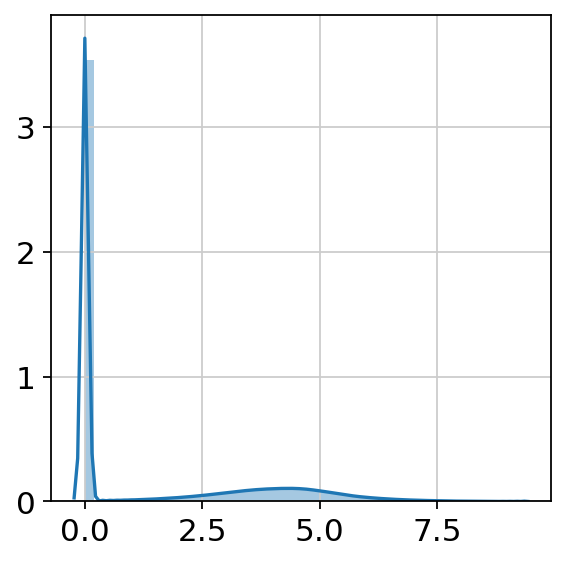

In [29]:
sns.distplot(hist)

In [30]:
soupx_denoised_prot_joint_table

,CD80.1_protein_denoised_SoupX,CD86.1_protein_denoised_SoupX,CD274(B7-H1)_protein_denoised_SoupX,CD273(B7-DC)_protein_denoised_SoupX,CD275(B7-H2)_protein_denoised_SoupX,CD11b_protein_denoised_SoupX,CD252(OX40L)_protein_denoised_SoupX,CD137L(4-1BBLigand)_protein_denoised_SoupX,CD155(PVR)_protein_denoised_SoupX,CD112(Nectin-2)_protein_denoised_SoupX,...,CD101(BB27)_protein_denoised_SoupX,CD360(IL-21R)_protein_denoised_SoupX,CD88(C5aR)_protein_denoised_SoupX,HLA-F.1_protein_denoised_SoupX,NLRP2.1_protein_denoised_SoupX,Podocalyxin_protein_denoised_SoupX,CD224_protein_denoised_SoupX,anti-c-Met_protein_denoised_SoupX,CD258(LIGHT)_protein_denoised_SoupX,DR3(TRAMP)_protein_denoised_SoupX
AAACCTGAGAATGTGT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,3.894468,0.000000,0.000000,0.000000,6.295564,0.000000,4.156225,4.270304,4.896377,...,5.770088,2.815436,6.939477,0.000000,0.000000,0.000000,4.993626,0.000000,0.000000,0.000000
AAACCTGAGACTAAGT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,3.746194,4.271046,0.000000,4.048441,0.000000,0.000000,0.000000,0.000000,4.408454,0.000000,...,5.585437,0.000000,5.462204,0.000000,0.000000,0.000000,5.566516,0.000000,0.000000,0.000000
AAACCTGAGCCGCCTA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,4.117870,5.073494,0.000000,4.188833,3.365124,0.000000,0.000000,0.000000,...,6.070794,4.490791,0.000000,0.000000,4.715181,0.000000,4.232258,4.077305,0.000000,3.858936
AAACCTGAGCGCCTCA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,0.000000,0.000000,2.644333,5.420405,3.585005,1.550438,0.000000,0.000000,...,3.913147,0.000000,0.000000,0.000000,5.357748,0.000000,0.000000,0.000000,0.000000,0.000000
AAACCTGAGGATGTAT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,5.190176,0.000000,2.909396,4.290002,0.000000,0.000000,0.000000,0.000000,...,6.037193,0.000000,0.000000,0.000000,0.000000,2.877851,0.000000,4.368663,0.000000,4.160918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCCCTTGCA-1_35171_CV005_RV9039363,2.917427,0.000000,0.000000,0.000000,0.000000,3.129226,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,3.816069,3.076227,0.000000,0.000000,4.746954,1.532321,2.350467,0.000000
TTTGTCATCCGCGTTT-1_35171_CV005_RV9039363,3.458457,1.675239,0.000000,3.458135,0.000000,3.746931,0.000000,4.216892,0.000000,2.969864,...,0.000000,1.923616,0.000000,3.220226,4.506400,0.000000,0.000000,0.000000,4.153026,3.626555
TTTGTCATCGGAGGTA-1_35171_CV005_RV9039363,3.886859,0.000000,0.000000,0.000000,1.092897,2.515122,0.000000,1.938044,0.407974,1.482652,...,0.000000,1.961069,0.000000,0.000000,5.241604,1.222350,0.000000,0.000000,4.403562,3.144162
TTTGTCATCGGCTACG-1_35171_CV005_RV9039363,3.217927,0.000000,0.000000,0.000000,3.920173,4.949906,2.624104,2.107248,2.763763,2.316100,...,0.000000,2.984488,4.304227,2.958593,0.000000,0.000000,0.000000,4.094192,3.932453,4.121213


In [31]:
def add_prot(barcode_sample_tag, protein):
    curr_value = soupx_denoised_prot_joint_table.loc[barcode_sample_tag, protein]
    return(curr_value)

In [32]:
Abs_list_SoupX = list(soupx_denoised_prot_joint_table.columns)

In [33]:
for Ab in Abs_list_SoupX:
    print(Ab, Abs_list_SoupX.index(Ab) + 1, 'out of', len(Abs_list_SoupX))
    adata.obs[Ab] = adata.obs['cell_id'].apply(lambda x: add_prot(x, Ab))

CD80.1_protein_denoised_SoupX 1 out of 192
CD86.1_protein_denoised_SoupX 2 out of 192
CD274(B7-H1)_protein_denoised_SoupX 3 out of 192
CD273(B7-DC)_protein_denoised_SoupX 4 out of 192
CD275(B7-H2)_protein_denoised_SoupX 5 out of 192
CD11b_protein_denoised_SoupX 6 out of 192
CD252(OX40L)_protein_denoised_SoupX 7 out of 192
CD137L(4-1BBLigand)_protein_denoised_SoupX 8 out of 192
CD155(PVR)_protein_denoised_SoupX 9 out of 192
CD112(Nectin-2)_protein_denoised_SoupX 10 out of 192
CD47.1_protein_denoised_SoupX 11 out of 192
CD70.1_protein_denoised_SoupX 12 out of 192
CD30_protein_denoised_SoupX 13 out of 192
CD40.1_protein_denoised_SoupX 14 out of 192
CD154_protein_denoised_SoupX 15 out of 192
CD52.1_protein_denoised_SoupX 16 out of 192
CD3_protein_denoised_SoupX 17 out of 192
CD8_protein_denoised_SoupX 18 out of 192
CD56(NCAM)_protein_denoised_SoupX 19 out of 192
CD19.1_protein_denoised_SoupX 20 out of 192
CD33.1_protein_denoised_SoupX 21 out of 192
CD11c_protein_denoised_SoupX 22 out of 19

In [ ]:
%%time
# already done, takes about 9 minutes
sc.pl.umap(adata, color=Abs_list_SoupX + ['prelim_annot'],
          cmap='OrRd', save='_protein_counts_denoised_with_SoupX_and_normlog_on_GEX-only_manifold_validation_cohort_20210212.pdf')

In [35]:
adata

AnnData object with n_obs × n_vars = 107050 × 2791
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase', 'probabilities', 'celltype_predictions', 'louvain', 'louvain_R_16', 'louvain_R_4', 'louvain_R_11', 'louvain_R_3', 'louvain_R_17', 'barcode', 'prelim_annot', 'barcode_sample', 'CD80.1_protein_denoised_SoupX', 'CD86.1_protein_denoised_SoupX', 'CD274(B7-H1)_protein_denoised_SoupX', 'CD273(B7-DC)_protein_denoised_SoupX', 'CD275(B7-H2)_protein_denoised_SoupX', 'CD11b_protein_denoised_SoupX', 'CD252(OX40L)_protein_denoised_SoupX', 'CD137L(4-1BBLigand)_protein_denoised_SoupX', 'CD155(PVR)_protein_denoised_SoupX', 'CD112(Nectin-2)_protein_denoised_SoupX', 'CD47.1_protein_denoised_SoupX', 'CD70.1_protein_denoised_SoupX', 'CD30_protein_denoised_SoupX', 'CD40.1_protein_denoised_SoupX', 'CD154_protein_denoised_SoupX', 'CD52

In [43]:
# plotting the number of protein counts for comparisons later
# reading the raw filtered object
adata_raw = sc.read(save_path+'adata_raw_filtered.h5ad')

In [44]:
adata_raw

AnnData object with n_obs × n_vars = 152639 × 20209
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'

In [45]:
adata_raw.var['feature_types-0'].value_counts()

Gene Expression     17254
nan                  2763
Antibody Capture      192
Name: feature_types-0, dtype: int64

In [46]:
adata_raw_protein = adata_raw[:,adata_raw.var['feature_types-0'] == 'Antibody Capture']

In [47]:
adata_raw_protein.obs['n_counts_protein'] = adata_raw_protein.X.sum(axis=1).A1

Trying to set attribute `.obs` of view, copying.


In [48]:
adata.obs['n_counts_protein'] = adata_raw_protein.obs.loc[adata.obs.index, 'n_counts_protein']

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:961: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


In [49]:
adata.obs

,n_genes,stimulation,sample,cell_id,percent_mito,n_counts,dataset,technique,scrublet_score,scrublet_cluster_score,...,CD360(IL-21R)_protein_denoised_SoupX,CD88(C5aR)_protein_denoised_SoupX,HLA-F.1_protein_denoised_SoupX,NLRP2.1_protein_denoised_SoupX,Podocalyxin_protein_denoised_SoupX,CD224_protein_denoised_SoupX,anti-c-Met_protein_denoised_SoupX,CD258(LIGHT)_protein_denoised_SoupX,DR3(TRAMP)_protein_denoised_SoupX,n_counts_protein
AAACCTGAGAATGTGT-1,2702,unstim,35008_CV005_RV9039258_and_35008_CV005_RV9039282,AAACCTGAGAATGTGT-1_35008_CV005_RV9039258_and_3...,0.018107,6589.0,GEX+CITE-seq,10X,0.228916,0.124573,...,0.000000,7.141815,0.000000,0.000000,0.000000,4.926615,0.000000,0.000000,0.000000,701.0
AAACCTGAGACTAAGT-1,3009,unstim,35008_CV005_RV9039258_and_35008_CV005_RV9039282,AAACCTGAGACTAAGT-1_35008_CV005_RV9039258_and_3...,0.039083,10531.0,GEX+CITE-seq,10X,0.119403,0.114516,...,0.000000,0.000000,0.000000,0.000000,0.000000,6.292872,0.000000,0.000000,0.000000,2211.0
AAACCTGAGCCGCCTA-1,630,unstim,35008_CV005_RV9039258_and_35008_CV005_RV9039282,AAACCTGAGCCGCCTA-1_35008_CV005_RV9039258_and_3...,0.039246,967.0,GEX+CITE-seq,10X,0.062818,0.088296,...,4.390762,0.000000,0.000000,4.509861,0.000000,4.050650,0.000000,0.000000,0.000000,307.0
AAACCTGAGCGCCTCA-1,629,unstim,35008_CV005_RV9039258_and_35008_CV005_RV9039282,AAACCTGAGCGCCTCA-1_35008_CV005_RV9039258_and_3...,0.028144,829.0,GEX+CITE-seq,10X,0.107668,0.090028,...,0.000000,0.000000,0.000000,5.539304,0.000000,0.000000,0.000000,0.000000,0.000000,308.0
AAACCTGAGGATGTAT-1,571,unstim,35008_CV005_RV9039258_and_35008_CV005_RV9039282,AAACCTGAGGATGTAT-1_35008_CV005_RV9039258_and_3...,0.015311,752.0,GEX+CITE-seq,10X,0.043189,0.066434,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.102645,0.000000,2.942536,293.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCGCCTGAG-1,2912,BCR,35171_CV005_RV9039364,TTTGTCATCGCCTGAG-1_35171_CV005_RV9039364,0.031893,11875.0,GEX+CITE-seq,10X,0.249131,0.083601,...,3.017410,6.426622,1.967820,0.000000,1.405832,6.037913,2.936212,1.765223,0.000000,NaN
TTTGTCATCGTCACGG-1-1,1932,BCR,35171_CV005_RV9039364,TTTGTCATCGTCACGG-1_35171_CV005_RV9039364,0.016973,4756.0,GEX+CITE-seq,10X,0.060729,0.067499,...,2.344286,5.174782,3.206254,3.969843,1.927677,3.641345,3.768183,3.009588,3.515150,NaN
TTTGTCATCGTCTGCT-1-1,1004,BCR,35171_CV005_RV9039364,TTTGTCATCGTCTGCT-1_35171_CV005_RV9039364,0.021543,2190.0,GEX+CITE-seq,10X,0.048426,0.040268,...,2.646898,0.000000,3.600230,4.606317,2.706490,3.733983,2.514838,0.000000,0.000000,NaN
TTTGTCATCTACTTAC-1,1791,BCR,35171_CV005_RV9039364,TTTGTCATCTACTTAC-1_35171_CV005_RV9039364,0.021367,5026.0,GEX+CITE-seq,10X,0.070628,0.058928,...,2.694165,5.803493,3.062123,1.976291,2.003603,4.501559,3.192223,3.201700,3.124799,NaN


In [52]:
adata

AnnData object with n_obs × n_vars = 163320 × 2461
    obs: 'n_genes', 'stimulation', 'sample', 'cell_id', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'donor_ID_temp', 'louvain', 'is_doublet_propagate', 'probabilities', 'celltype_predictions', 'louvain_R_16', 'louvain_R_24', 'louvain_R_0', 'louvain_R_9', 'louvain_R_1', 'prelim_annot', 'CD80.1_protein_denoised_SoupX', 'CD86.1_protein_denoised_SoupX', 'CD274(B7-H1)_protein_denoised_SoupX', 'CD273(B7-DC)_protein_denoised_SoupX', 'CD275(B7-H2)_protein_denoised_SoupX', 'CD11b_protein_denoised_SoupX', 'CD252(OX40L)_protein_denoised_SoupX', 'CD137L(4-1BBLigand)_protein_denoised_SoupX', 'CD155(PVR)_protein_denoised_SoupX', 'CD112(Nectin-2)_protein_denoised_SoupX', 'CD47.1_protein_denoised_SoupX', 'CD70.1_protein_denoised_SoupX', 'CD30_protein_denoised_SoupX', 'CD40.1_pro

In [53]:
adata.obs['n_counts_protein_lognorm'] = adata.obs['n_counts_protein']*10000 / np.sum(adata.obs['n_counts_protein'])
adata.obs['n_counts_protein_lognorm'] = np.log1p(adata.obs['n_counts_protein_lognorm'])

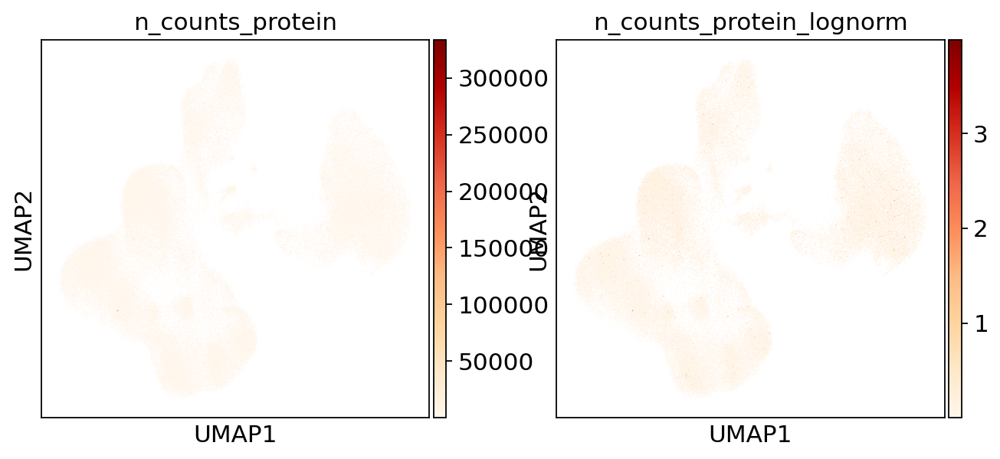

In [54]:
sc.pl.umap(adata, color=['n_counts_protein','n_counts_protein_lognorm'],
          cmap='OrRd')

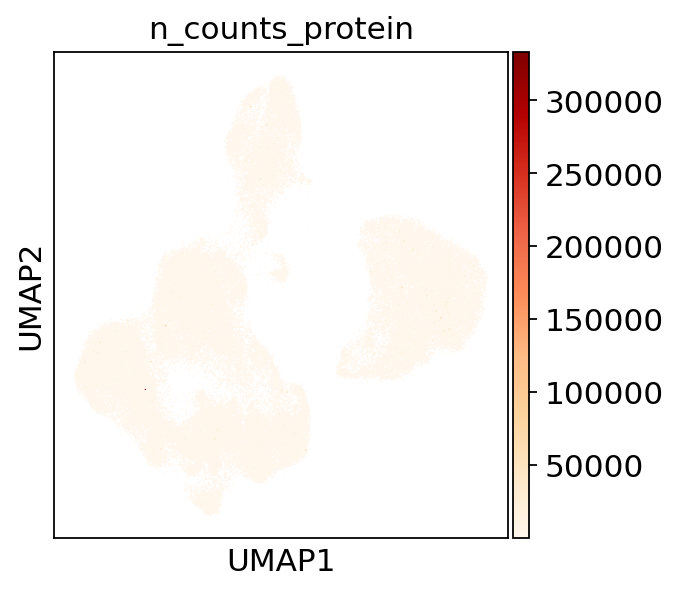

In [64]:
# old, 8 samples only
sc.pl.umap(adata, color='n_counts_protein',
          cmap='OrRd')

ValueError: cannot convert float NaN to integer

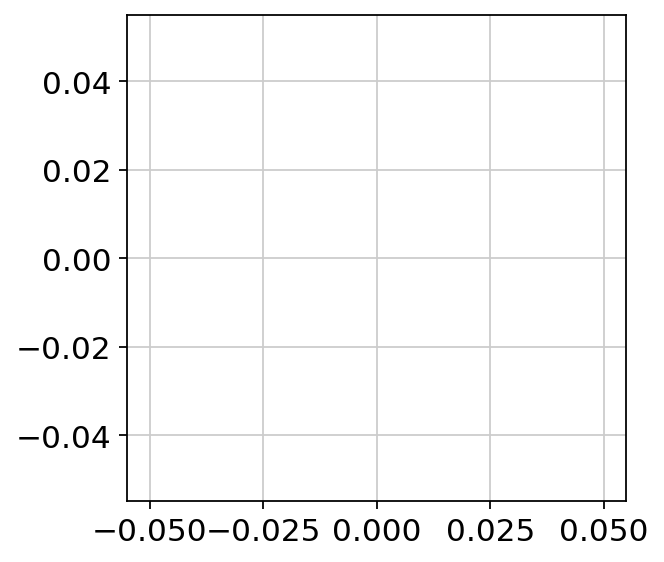

In [51]:
sns.distplot(adata.obs['n_counts_protein'])

<AxesSubplot:xlabel='n_counts_protein'>

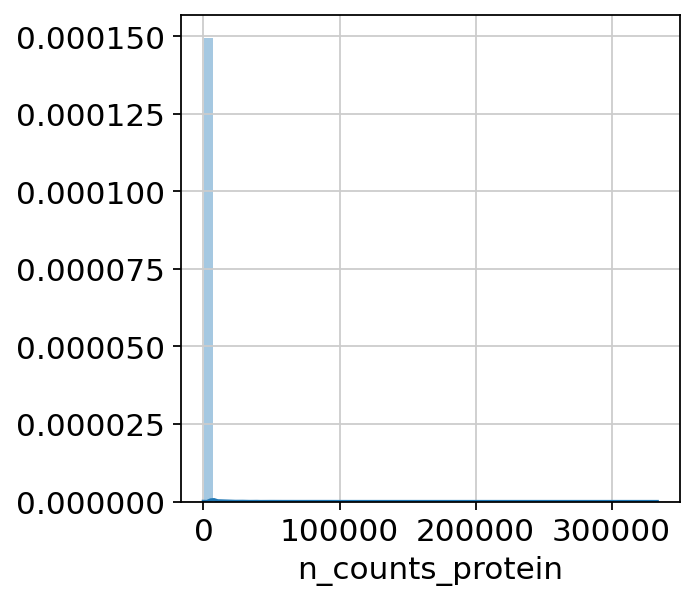

In [65]:
# old, 8 samples only
sns.distplot(adata.obs['n_counts_protein'])